In [111]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore', category=UserWarning, module='IPython.core.pylabtools')

In [85]:
sample_size = 2000

# Data Loading and Cleaning

In [86]:
# load pre-aggregation features
pre_agg = pd.read_csv(f'../results/pre-aggregation/liwcANDfeatures_results_{sample_size}.csv.gzip', compression='gzip')
pre_agg['final_message_string'] = pre_agg['final_message_string'].astype(str)

In [87]:
#assign sentiment column
pre_agg['sentiment'] = np.where(pre_agg['positive_sentiment'] == 1, 'positive', np.where(pre_agg['negative_sentiment'] == 1, 'negative', 'neutral'))

In [89]:
# load aggregated per author df
post_agg_author = pd.read_csv(f'../results/post-aggregation/author_{sample_size}.csv.gzip', compression='gzip')
#only keep rows of post_agg_author where own_message + forwarded_message is 1
post_agg_author = post_agg_author[post_agg_author['own_message'] + post_agg_author['forwarded_message'] == 1]

In [90]:
#load aggregated per author and date df
author_date = pd.read_csv(f'../results/post-aggregation/author_date_{sample_size}.csv.gzip', compression='gzip')
author_date['date'] = pd.to_datetime(author_date['date'])

In [182]:
# load aggregated per author and group df
author_group = pd.read_csv(f'../results/post-aggregation/author_group_{sample_size}.csv.gzip', compression='gzip')
# otherwise plt doesn't recognize unique values
author_group['group_name'] = author_group['group_name'].str.strip().str.lower()

In [92]:
#put all features to be plotted in one list
features = post_agg_author.columns[1:-10].append(post_agg_author.columns[-8:-6].append(post_agg_author.columns[-5:-1]))
features

Index(['noun_count', 'verb_count', 'adj_count', 'positive_sentiment',
       'negative_sentiment', 'neutral_sentiment', 'channel_messages',
       'group_messages', 'sent_count', 'word_count', 'avg_sent_length',
       'avg_word_length', 'exclamation_count', 'question_count', 'emoji_count',
       'flesch_reading_ease', 'liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other',
       'liwc_Affect', 'own_message', 'forwarded_message', 'own_message_count',
       'forwarded_message_count', 'action_quotient', 'sentiment_quotient'],
      dtype='object')

# Post-Aggregation Features over Time

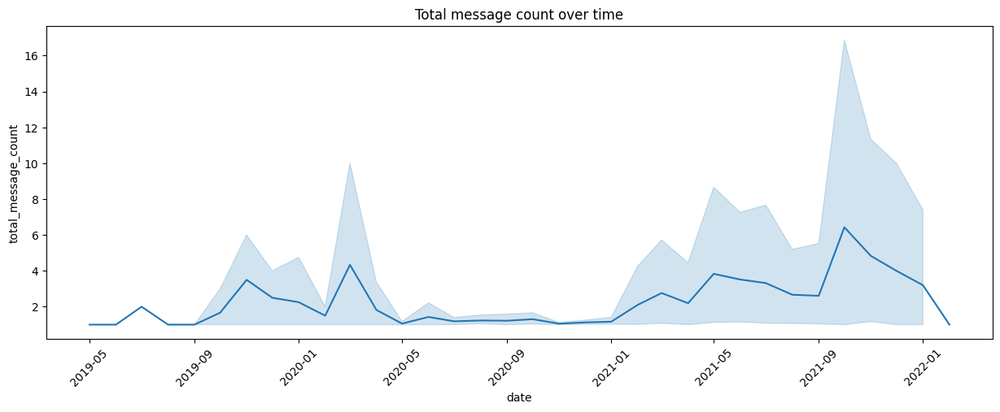

In [103]:
# message counts
plt.figure(figsize=(15, 5))
sns.lineplot(data=author_date, x='date', y='total_message_count', sort=True)
plt.xticks(rotation=45)
plt.title(f'Total message count over time')
plt.show()

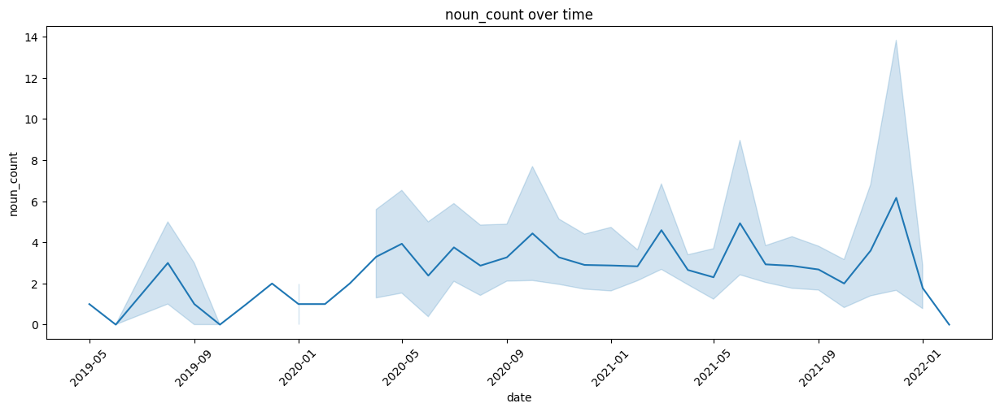

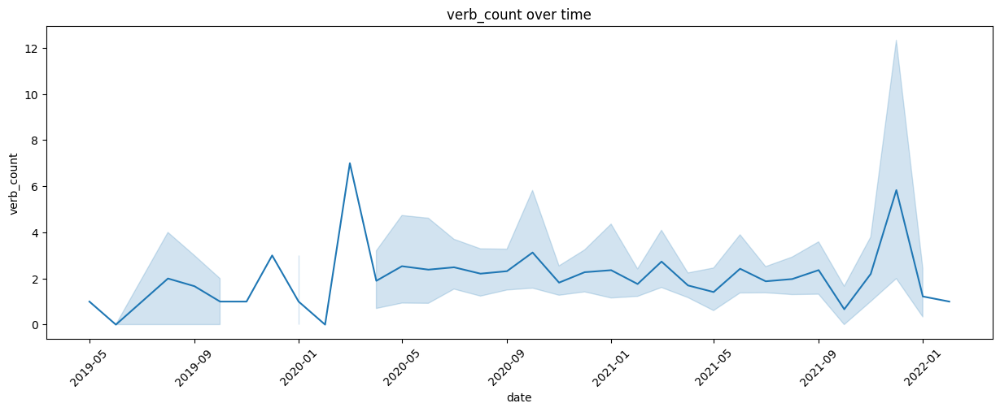

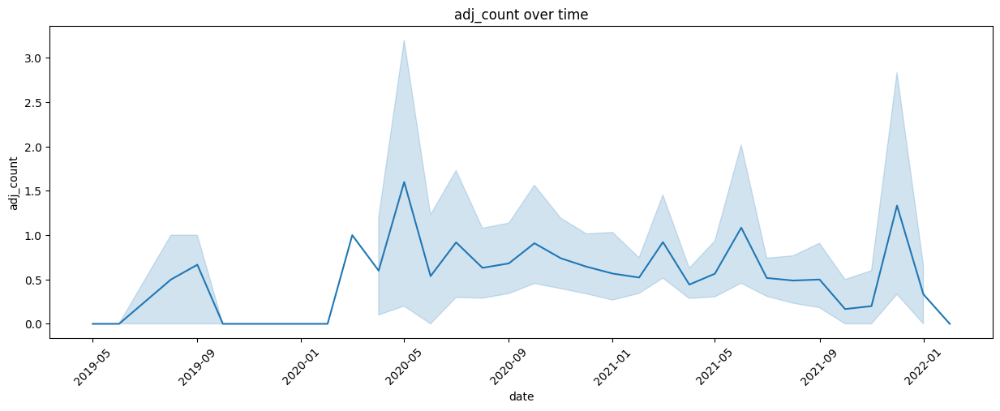

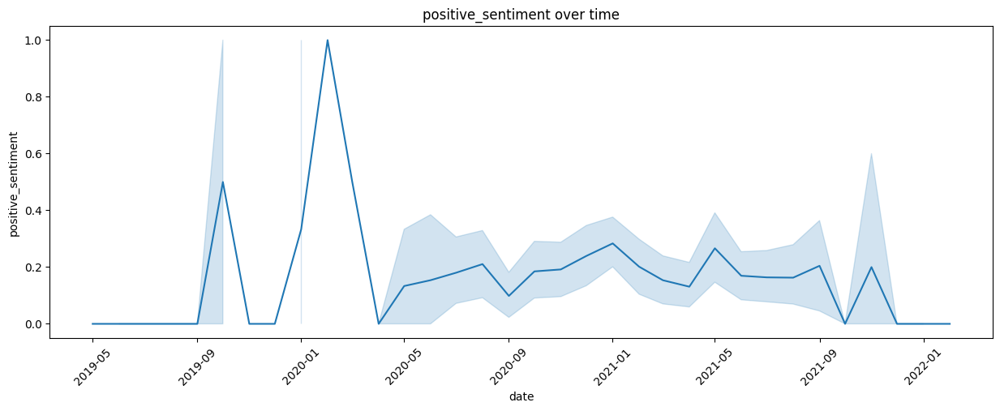

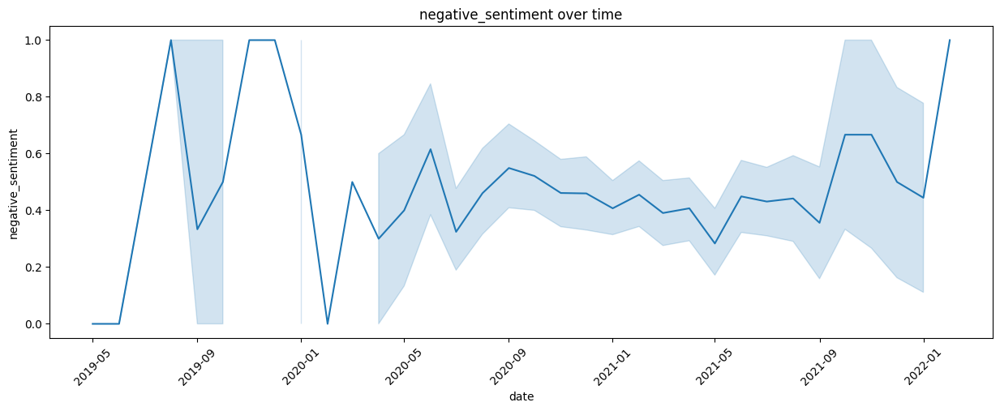

...

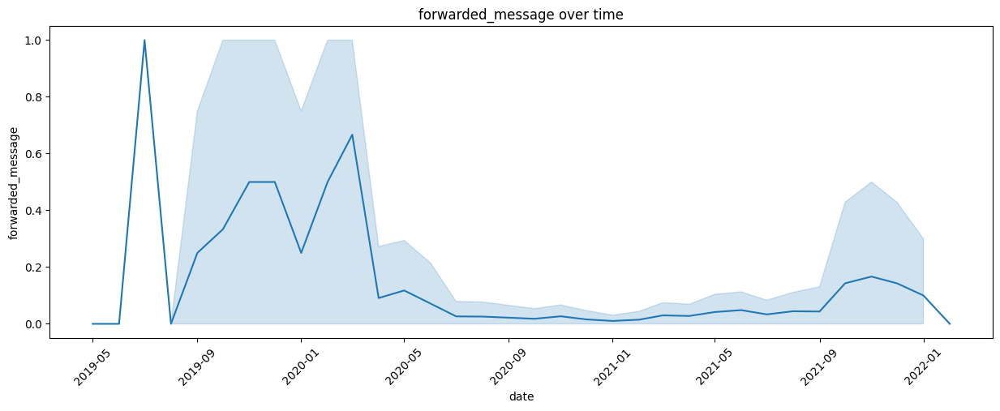

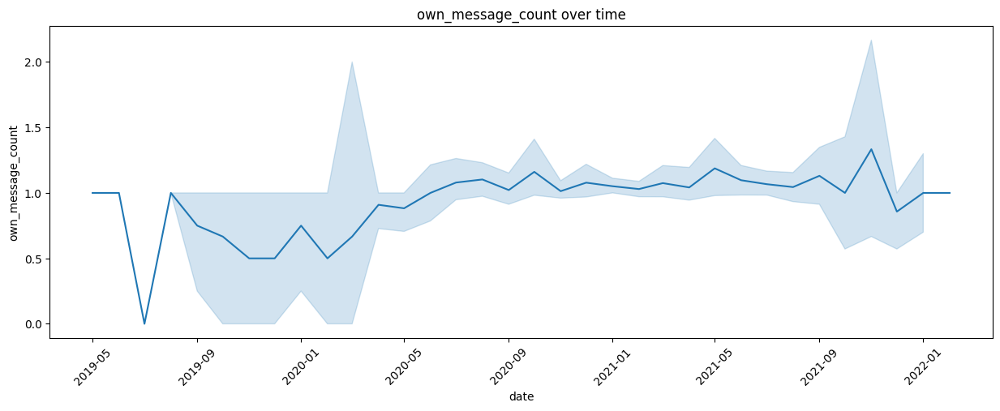

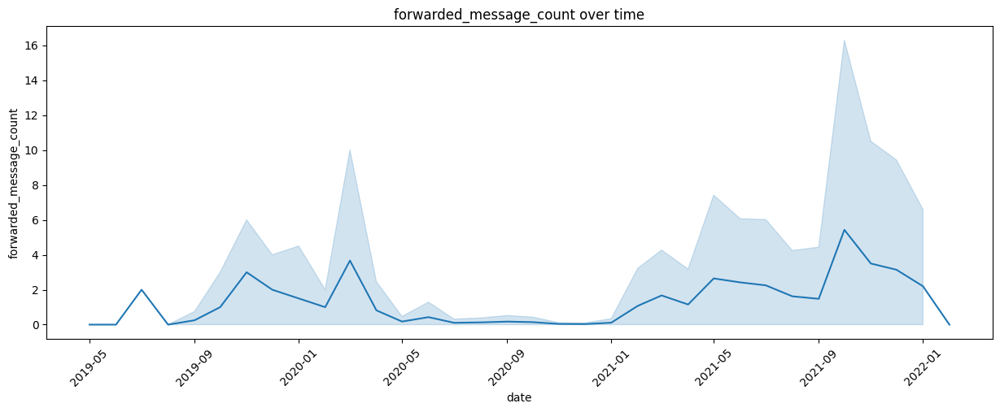

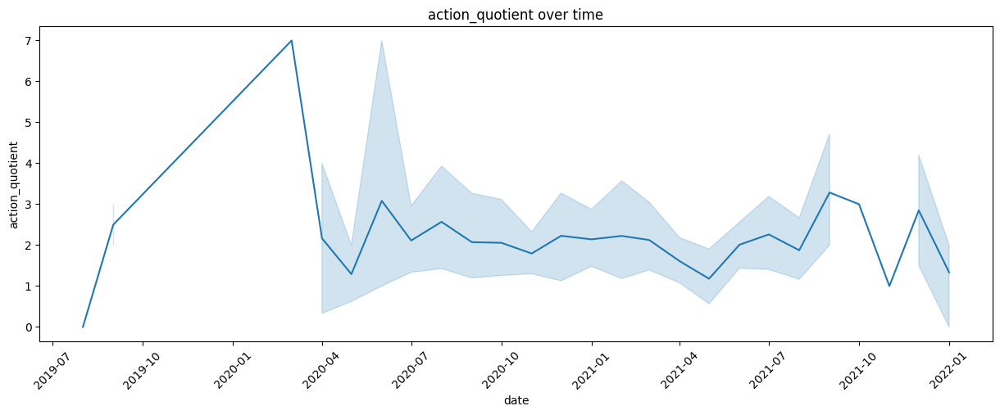

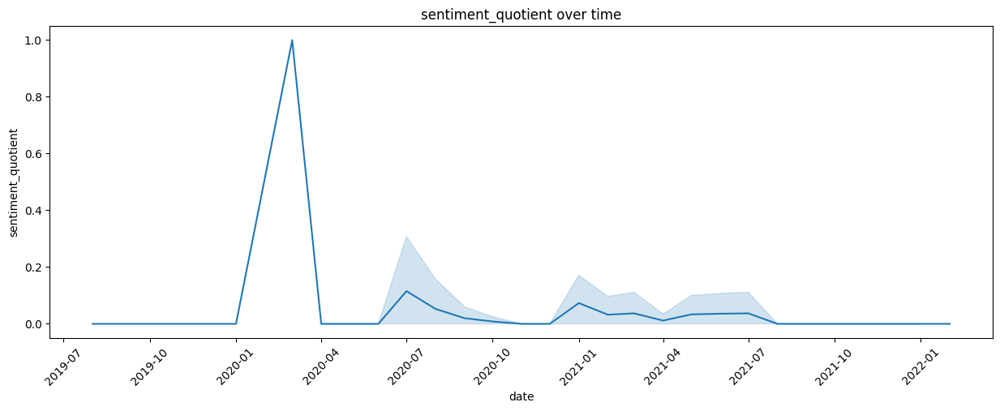

In [104]:
# avg of all features over time
for col in features:
    plt.figure(figsize=(15, 5))
    sns.lineplot(data=author_date, x='date', y=col, sort=True)
    plt.xticks(rotation=45)
    plt.title(f'{col} over time')
    plt.show()

# Post-Aggregation Features per Group

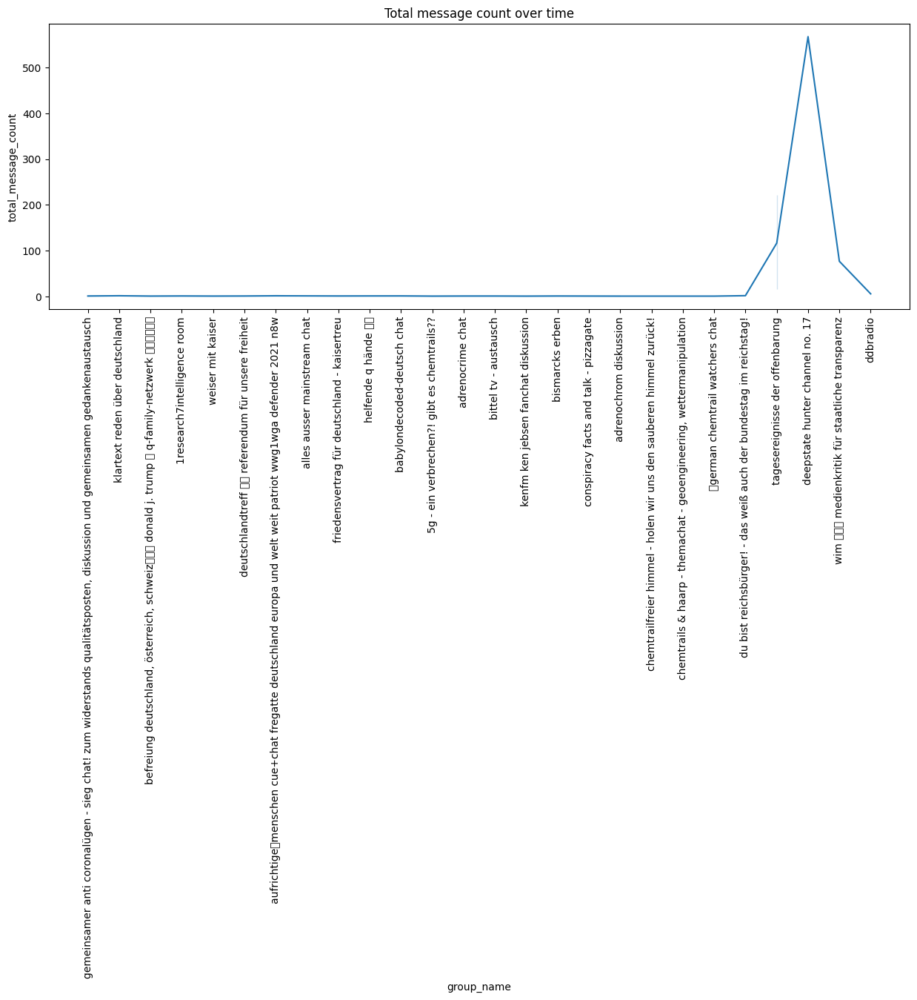

In [119]:
# message counts
plt.figure(figsize=(15, 5))
sns.lineplot(data=author_group, x='group_name', y='total_message_count', sort=True)
plt.xticks(rotation=90)
plt.title(f'Total message count over time')
plt.show()

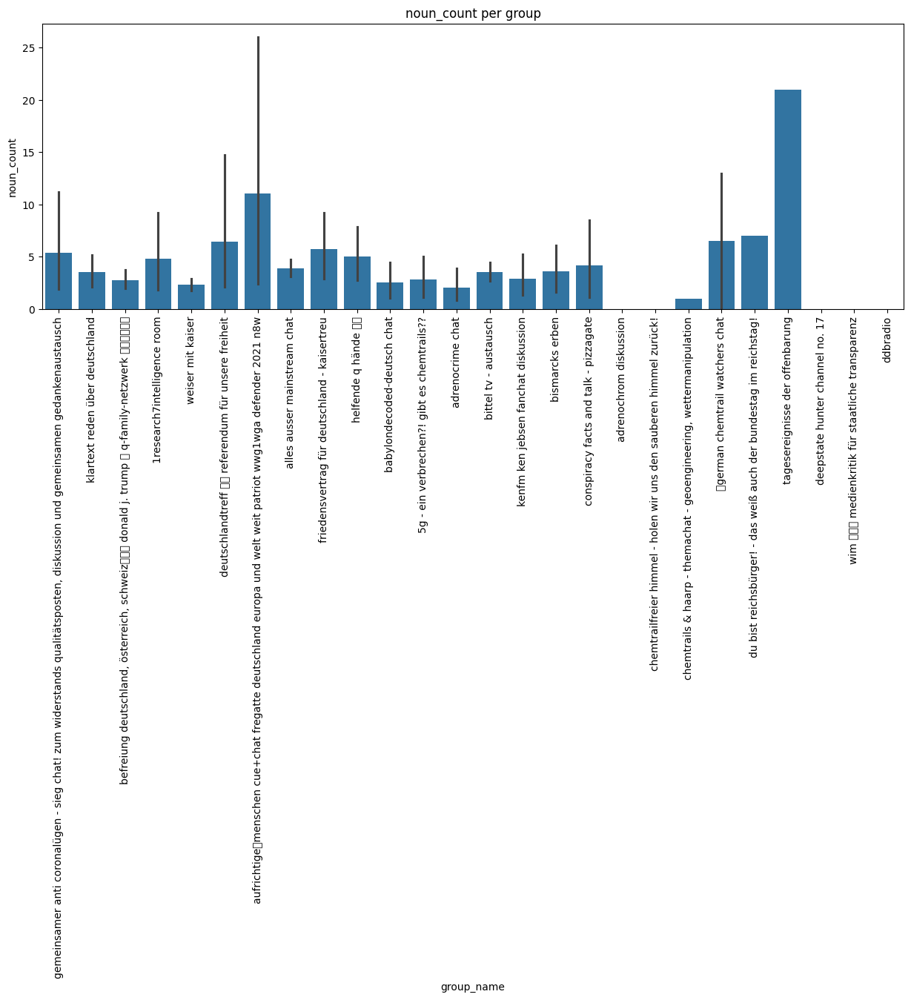

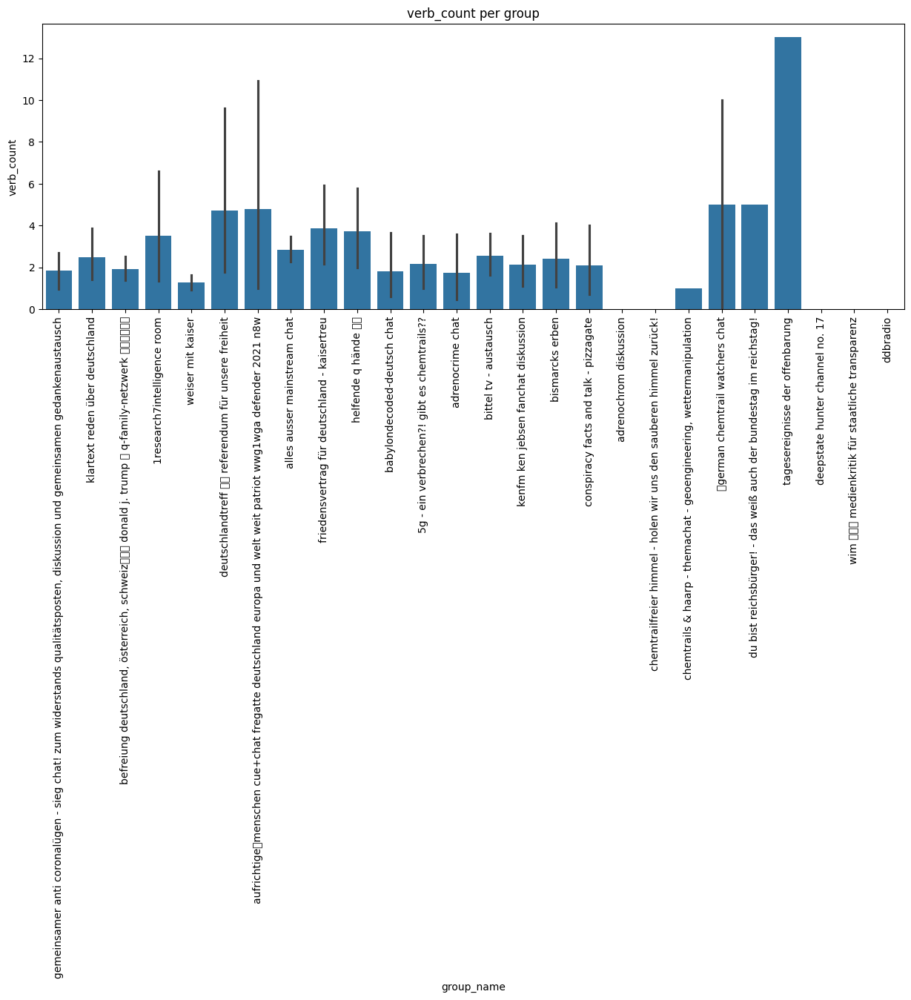

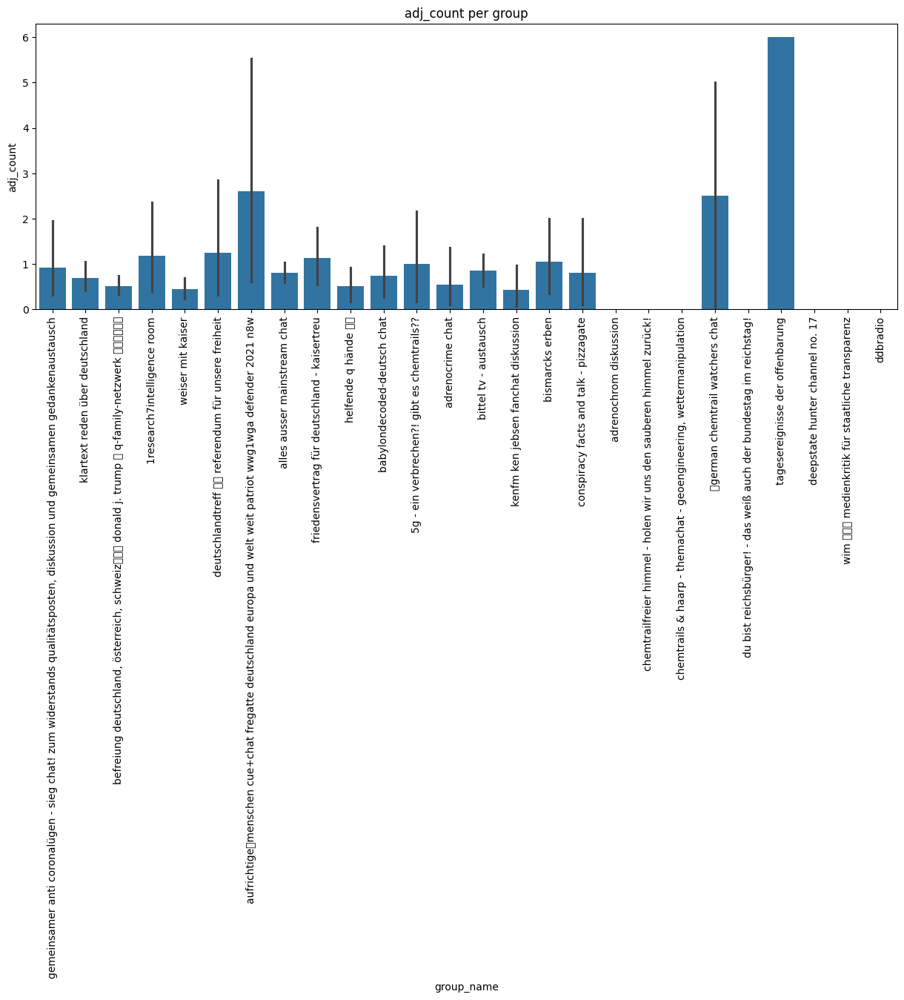

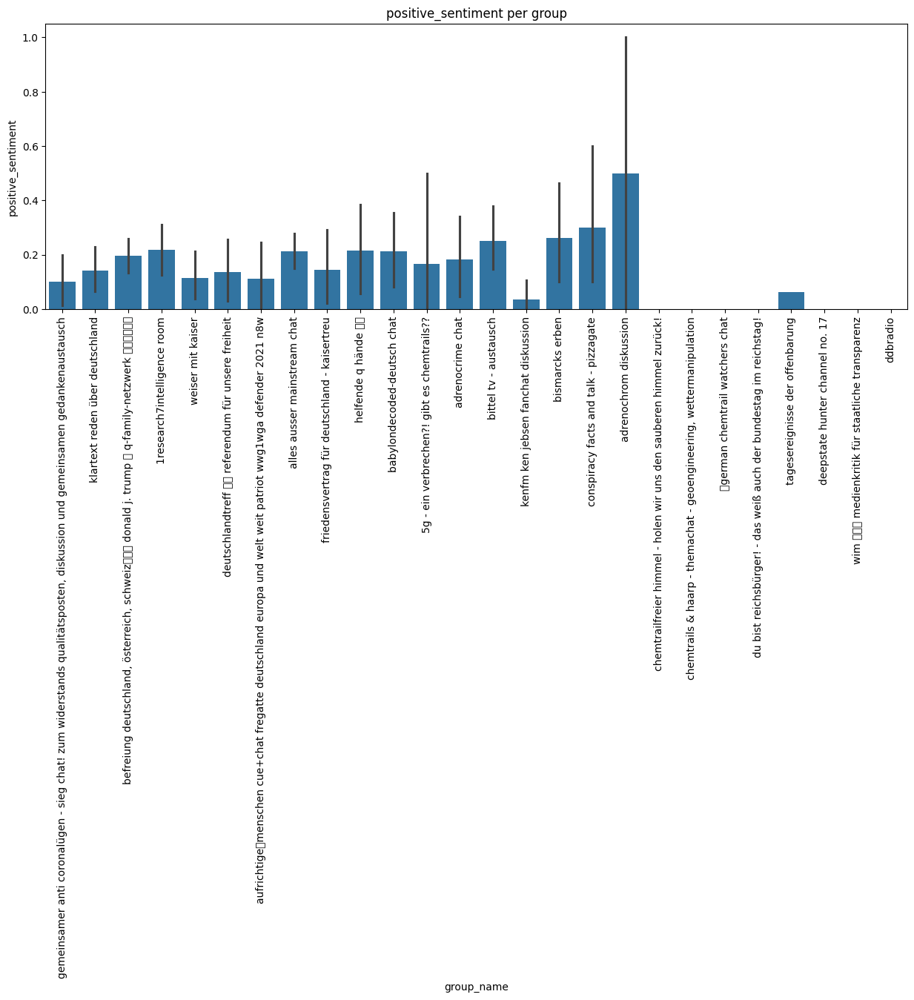

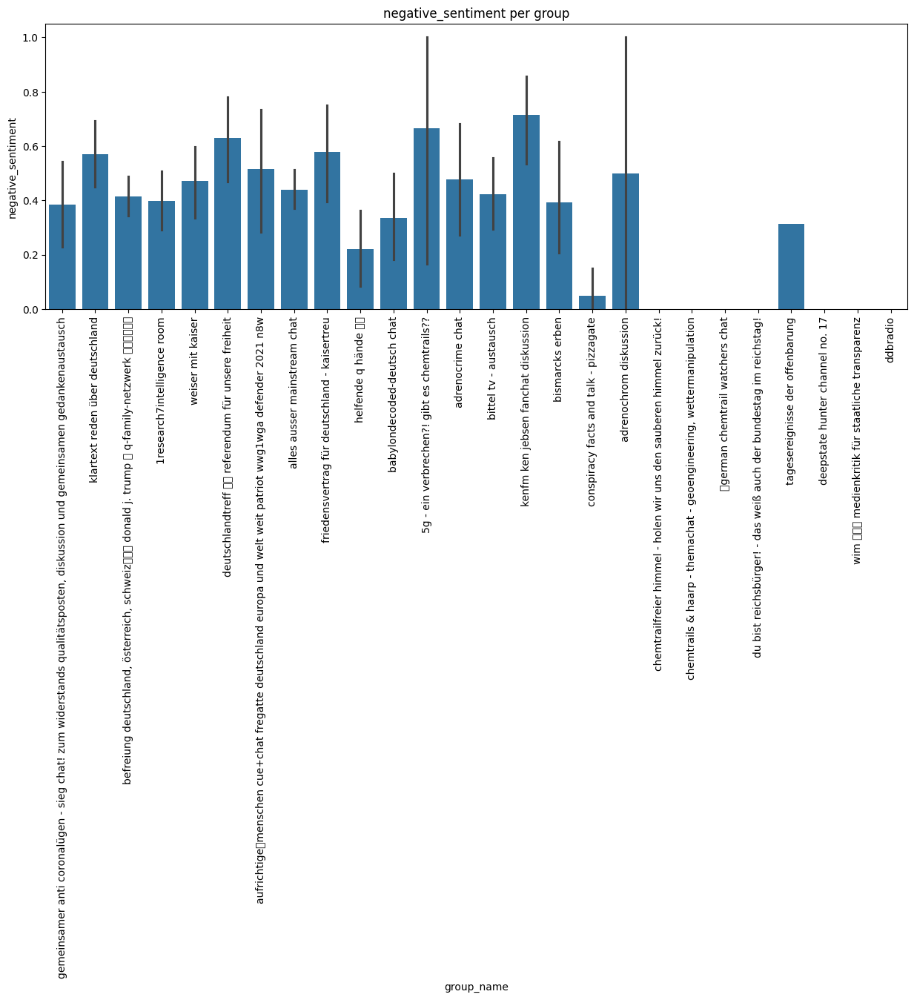

...

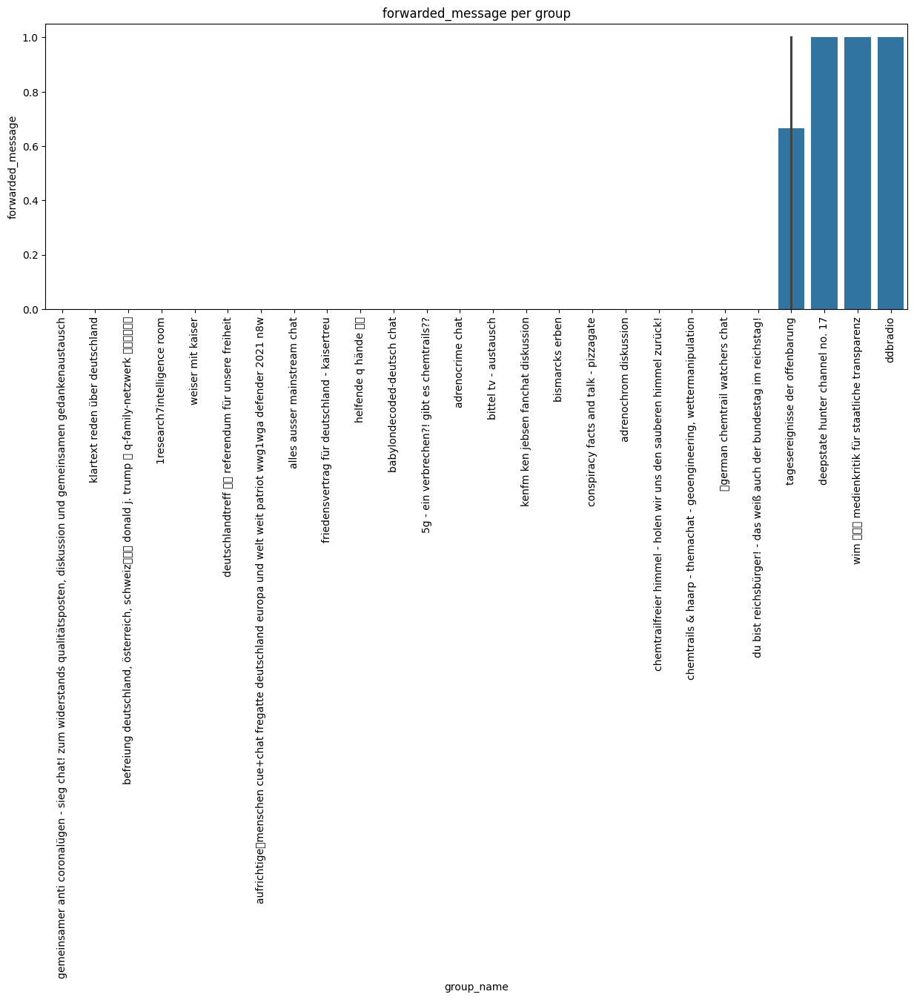

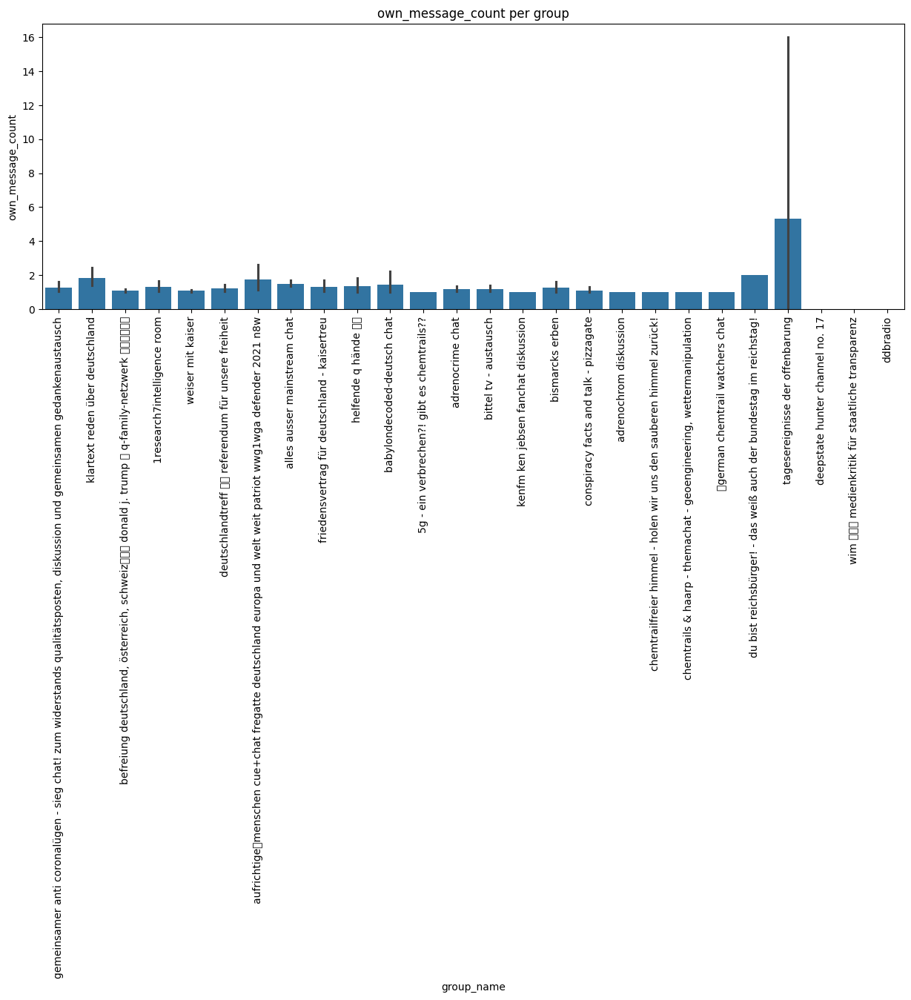

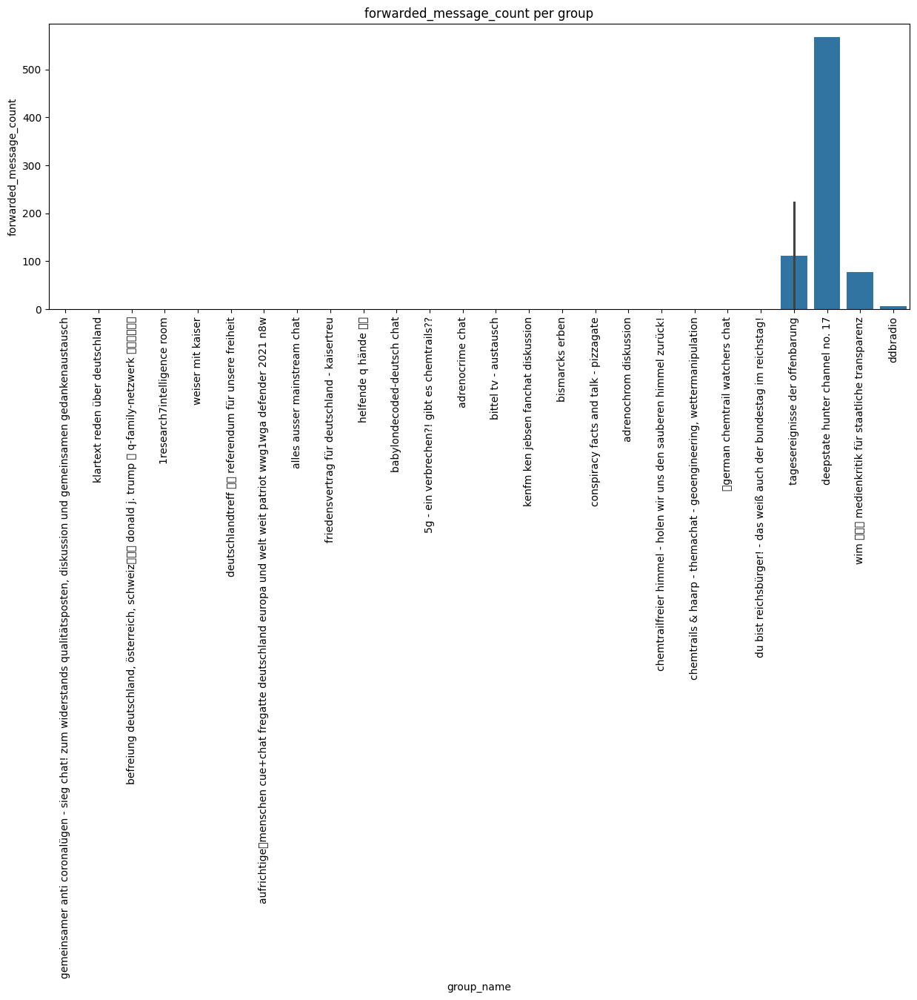

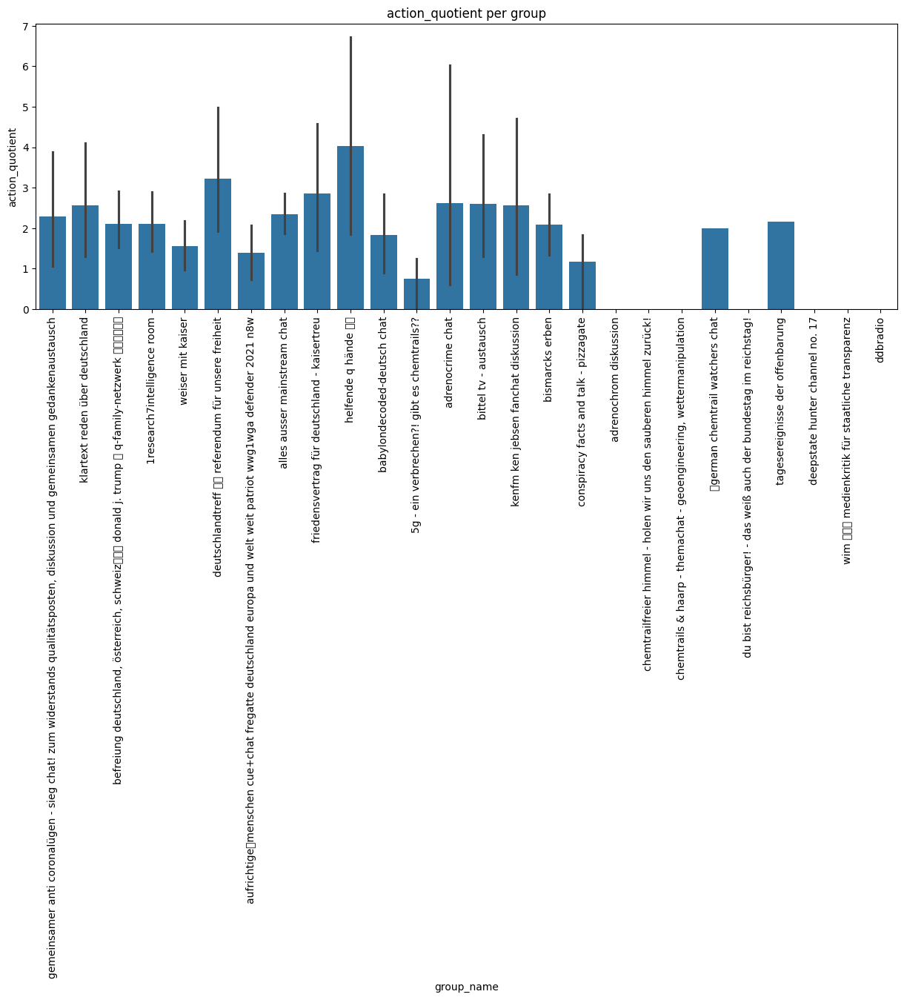

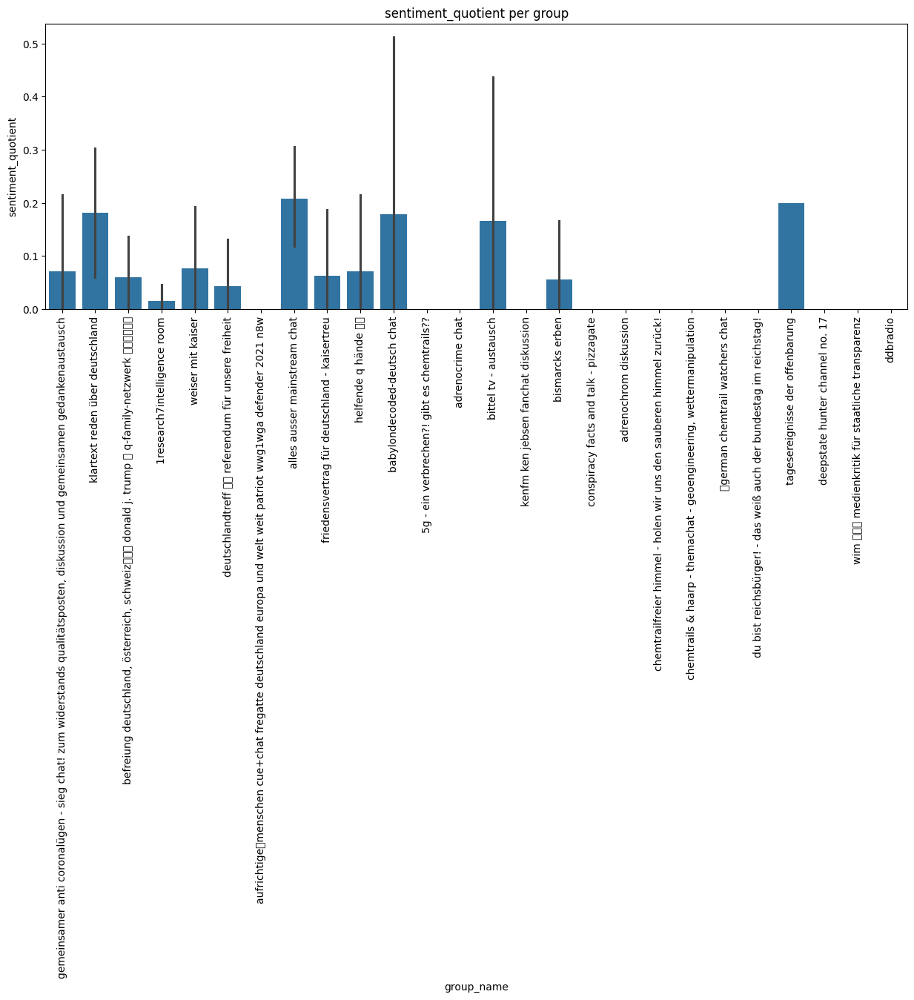

In [113]:
#plot avg of columns per group
for col in features:
    plt.figure(figsize=(15, 5))
    sns.barplot(data=author_group, x='group_name', y=col)
    plt.xticks(rotation=90)
    plt.title(f'{col} per group')
    plt.show()

# Channel vs. Group Messages

In [107]:
pre_agg.columns

Index(['UID_key', 'author', 'fwd_message', 'date', 'group_or_channel',
       'own_message', 'forwarded_message', 'group_name', 'fwd_message_string',
       'final_message', 'final_message_string', 'sent_count', 'word_count',
       'avg_sent_length', 'avg_word_length', 'exclamation_count',
       'question_count', 'emoji_count', 'noun_count', 'verb_count',
       'adj_count', 'flesch_reading_ease', 'flesch_reading_ease_class',
       'positive_sentiment', 'negative_sentiment', 'neutral_sentiment',
       'liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other', 'liwc_Affect',
       'sentiment'],
      dtype='object')

In [122]:
pre_features = pre_agg.columns[5:7].append(pre_agg.columns[11:22].append(pre_agg.columns[26:]))
pre_features

Index(['own_message', 'forwarded_message', 'sent_count', 'word_count',
       'avg_sent_length', 'avg_word_length', 'exclamation_count',
       'question_count', 'emoji_count', 'noun_count', 'verb_count',
       'adj_count', 'flesch_reading_ease', 'liwc_I', 'liwc_We', 'liwc_You',
       'liwc_Other', 'liwc_Affect', 'sentiment'],
      dtype='object')

In [123]:
plotting = pre_agg[pre_agg['own_message'] == 1]

## KDE

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_88127/3328825641.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(channels[col], label='Channel', fill=True)
/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_88127/3328825641.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(groups[col], label='Group', fill=True)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


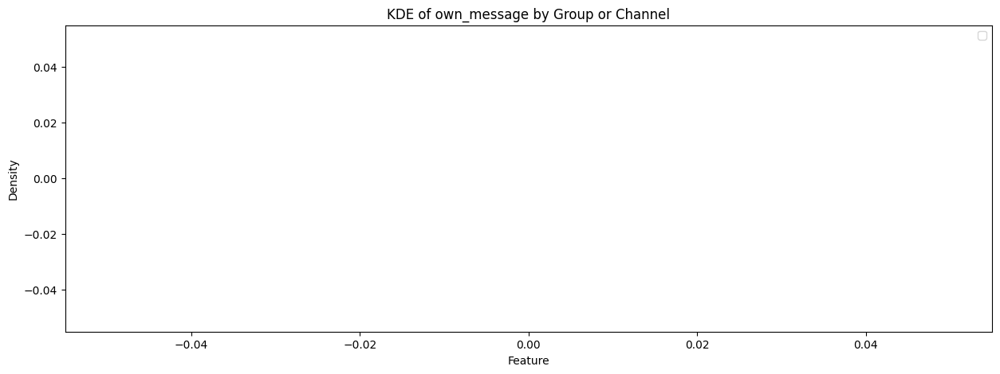

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_88127/3328825641.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(channels[col], label='Channel', fill=True)
/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_88127/3328825641.py:8: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(groups[col], label='Group', fill=True)
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


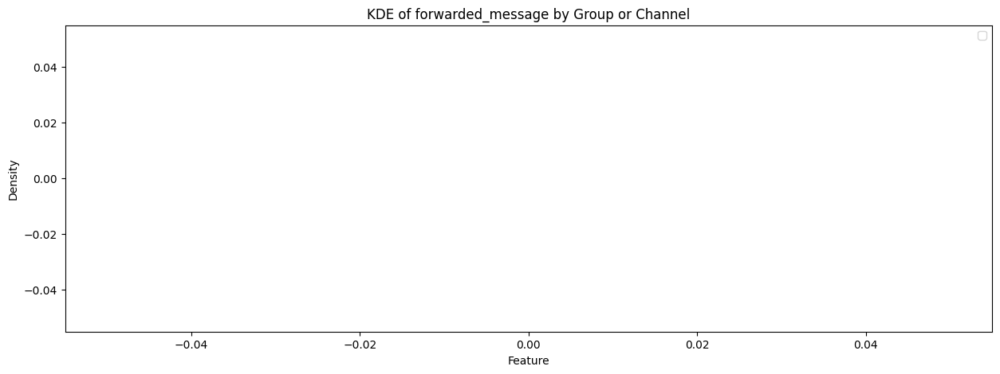

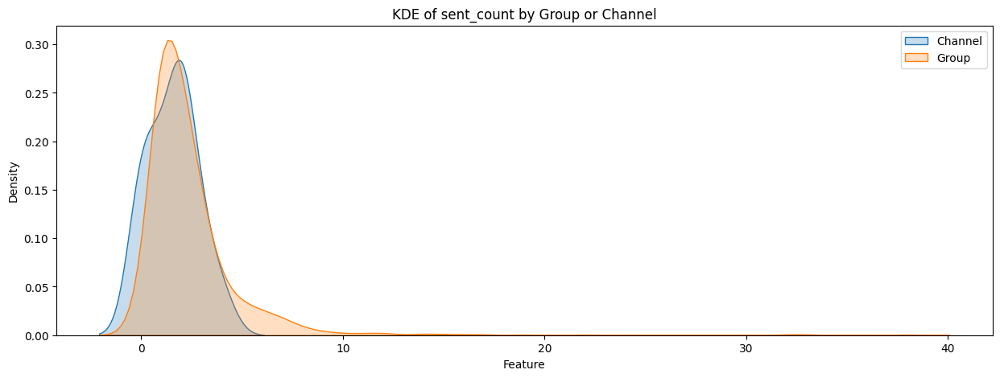

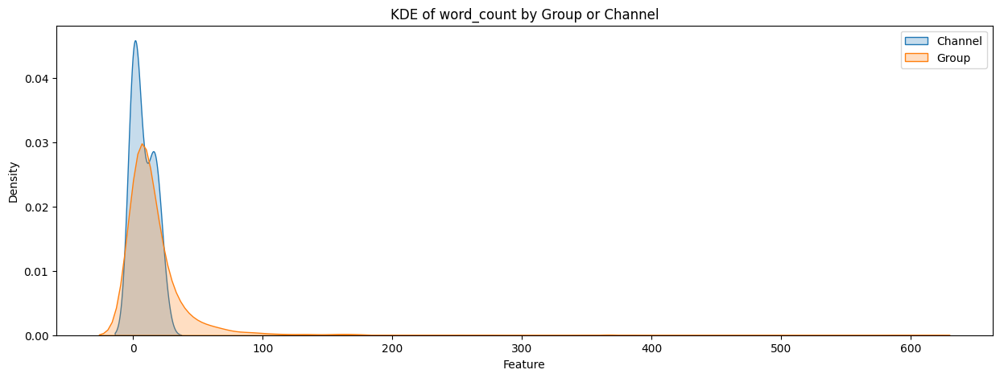

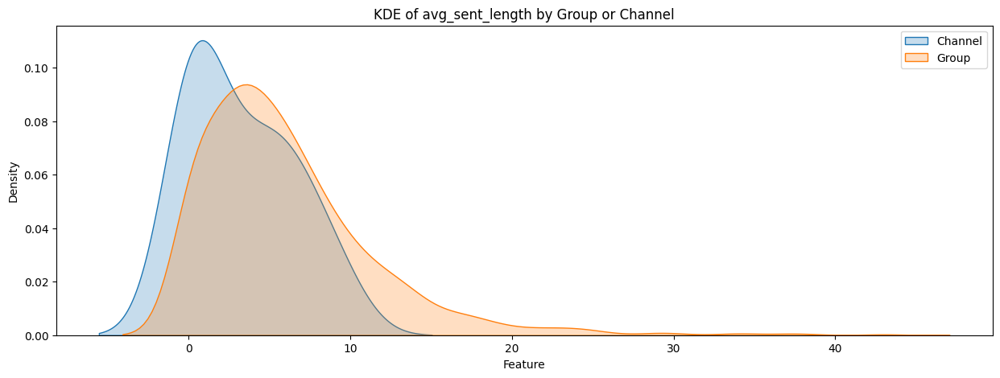

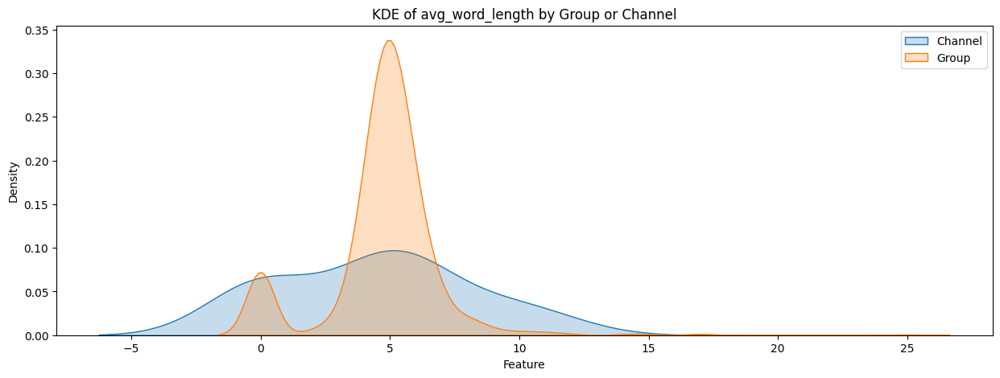

...

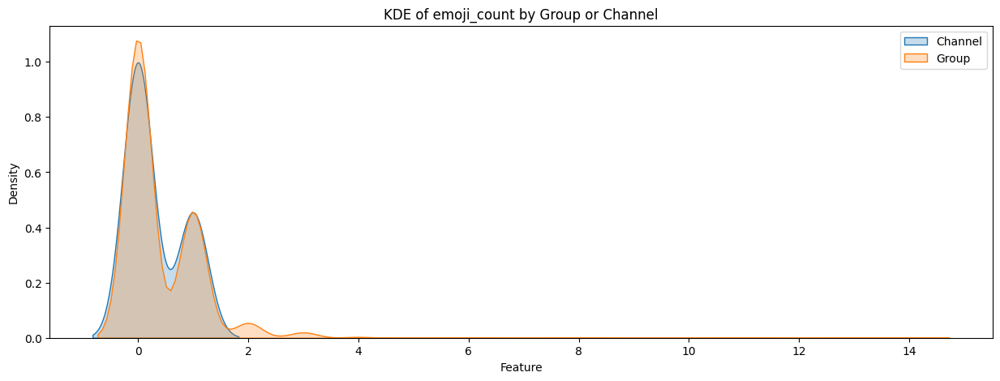

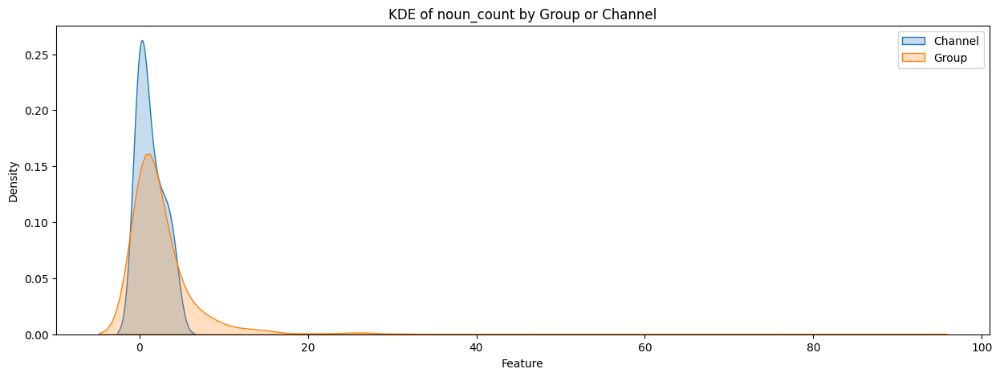

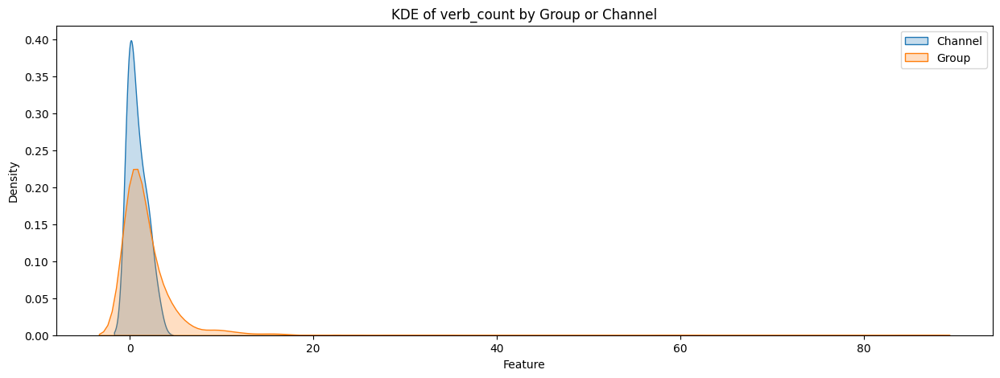

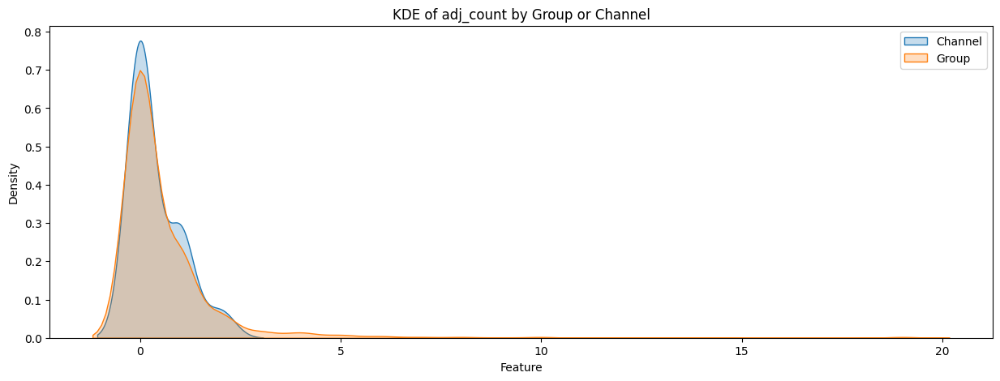

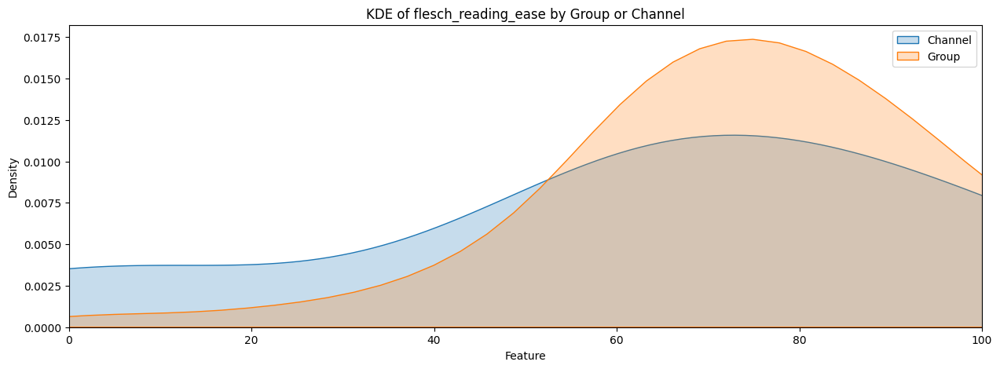

/var/folders/fd/qf26p3js3x32_9_qwsb841y80000gn/T/ipykernel_88127/3328825641.py:7: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(channels[col], label='Channel', fill=True)


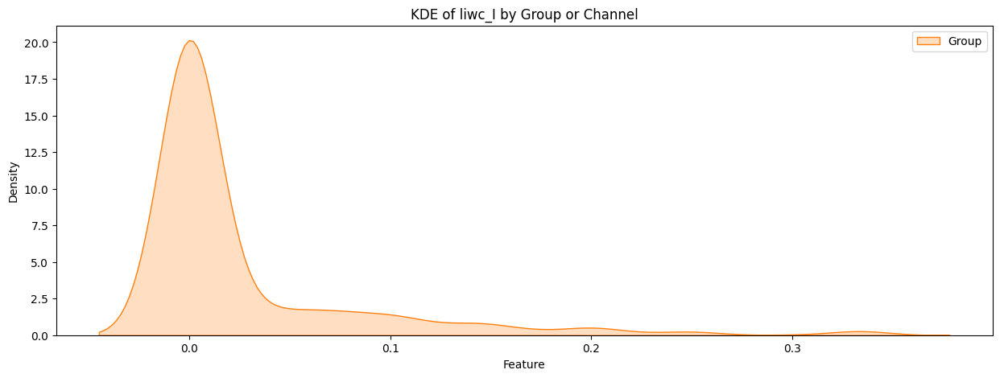

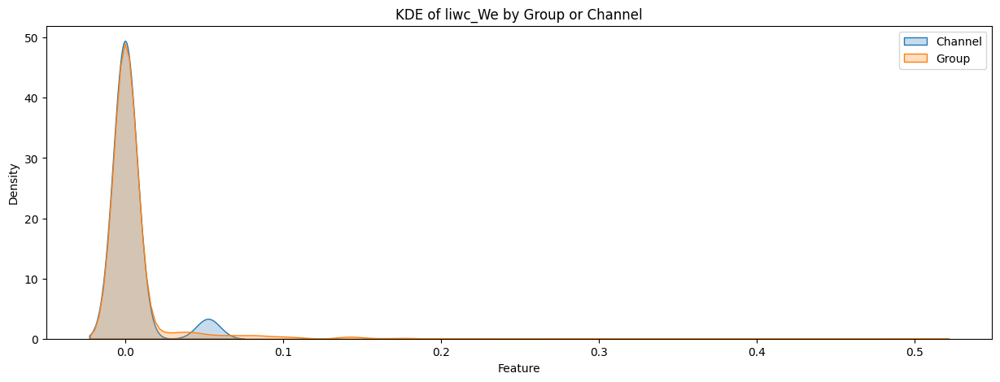

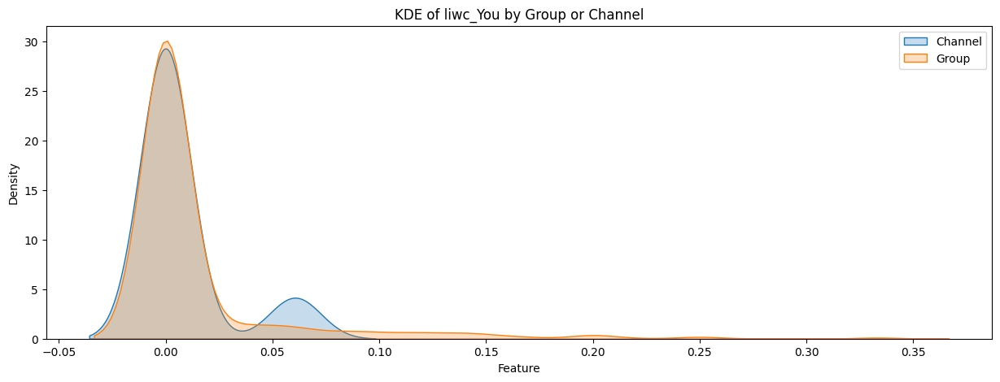

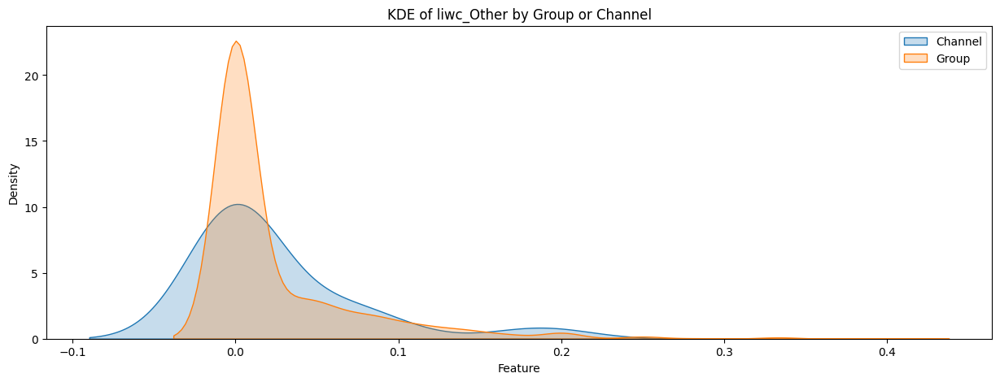

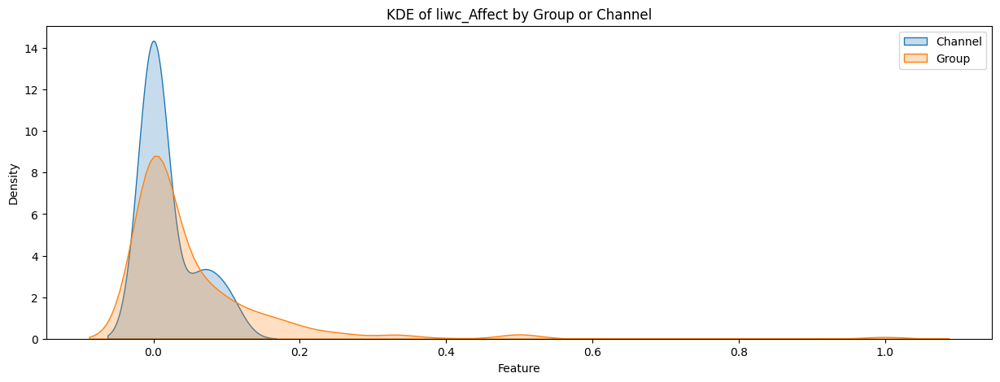

In [125]:
channels = plotting[plotting['group_or_channel'] == 'channel']
groups = plotting[plotting['group_or_channel'] == 'group']

#plot KDEs
for col in pre_features[:-1]:
    plt.figure(figsize=(15, 5))
    sns.kdeplot(channels[col], label='Channel', fill=True)
    sns.kdeplot(groups[col], label='Group', fill=True)
    plt.xlabel('Feature')
    plt.ylabel('Density')
    plt.title(f'KDE of {col} by Group or Channel')
    if col == 'flesch_reading_ease':
        plt.xlim(0,100)
    plt.legend()
    plt.show()

## Categorial Variables

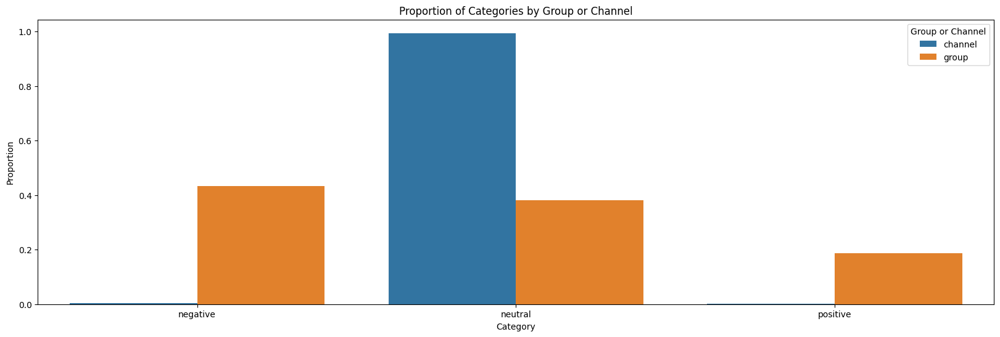

In [127]:
# Calculate proportions
prop_sent = pre_agg.groupby(['group_or_channel', 'sentiment']).size().reset_index(name='count')
prop_sent['proportion'] = prop_sent.groupby('group_or_channel')['count'].transform(lambda x: x / x.sum())

# Plotting the proportions
plt.figure(figsize=(20, 6))
sns.barplot(data=prop_sent, x='sentiment', y='proportion', hue='group_or_channel')
plt.title('Proportion of Categories by Group or Channel')
plt.xlabel('Category')
plt.ylabel('Proportion')
plt.legend(title='Group or Channel')
plt.show()

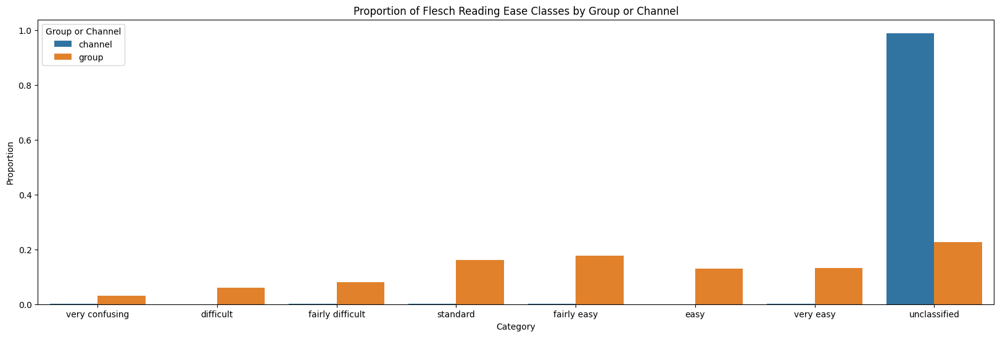

In [134]:
# Calculate proportions
prop_flesch = pre_agg.groupby(['group_or_channel', 'flesch_reading_ease_class']).size().reset_index(name='count')
prop_flesch['proportion'] = prop_flesch.groupby('group_or_channel')['count'].transform(lambda x: x / x.sum())

# ordering classes
label_order = ['very confusing', 'difficult', 'fairly difficult', 'standard', 'fairly easy', 'easy', 'very easy', 'unclassified']
prop_flesch['flesch_reading_ease_class'] = pd.Categorical(prop_flesch['flesch_reading_ease_class'], categories=label_order, ordered=True)

# Plotting the proportions
plt.figure(figsize=(20, 6))
sns.barplot(data=prop_flesch, x='flesch_reading_ease_class', y='proportion', hue='group_or_channel')
plt.title('Proportion of Flesch Reading Ease Classes by Group or Channel')
plt.xlabel('Category')
plt.ylabel('Proportion')
plt.legend(title='Group or Channel')
plt.show()

## Proportions

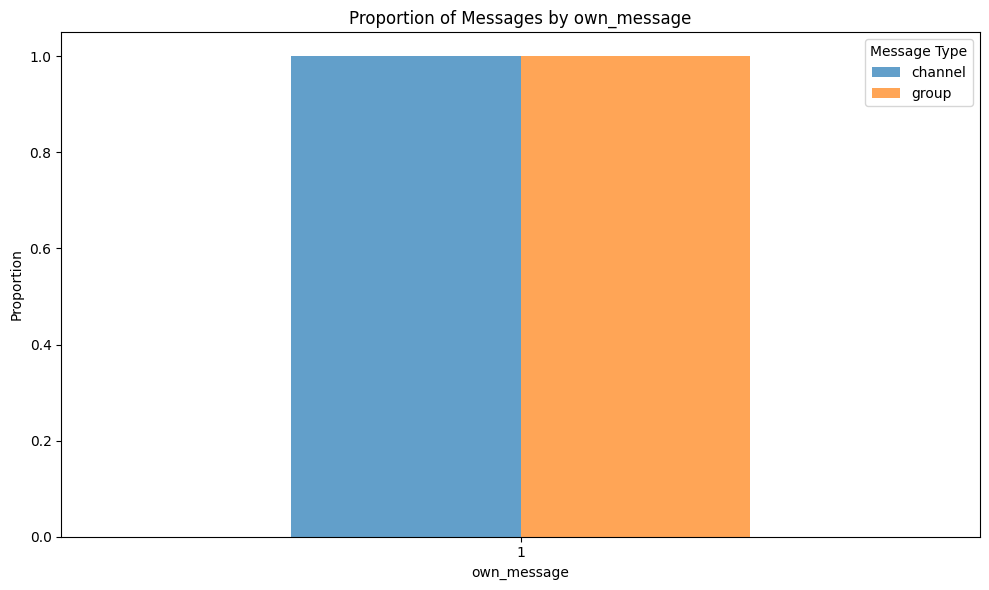

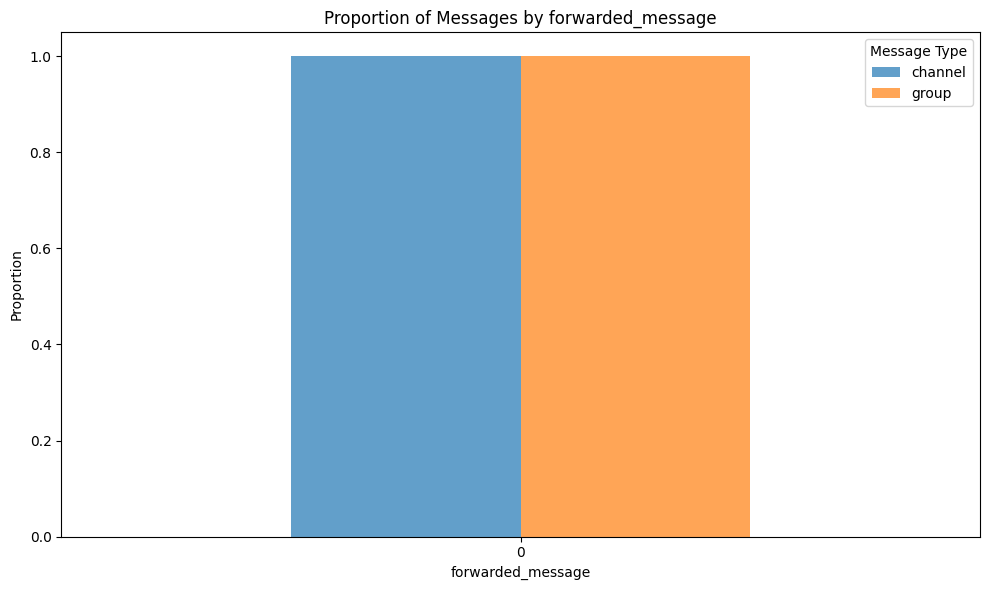

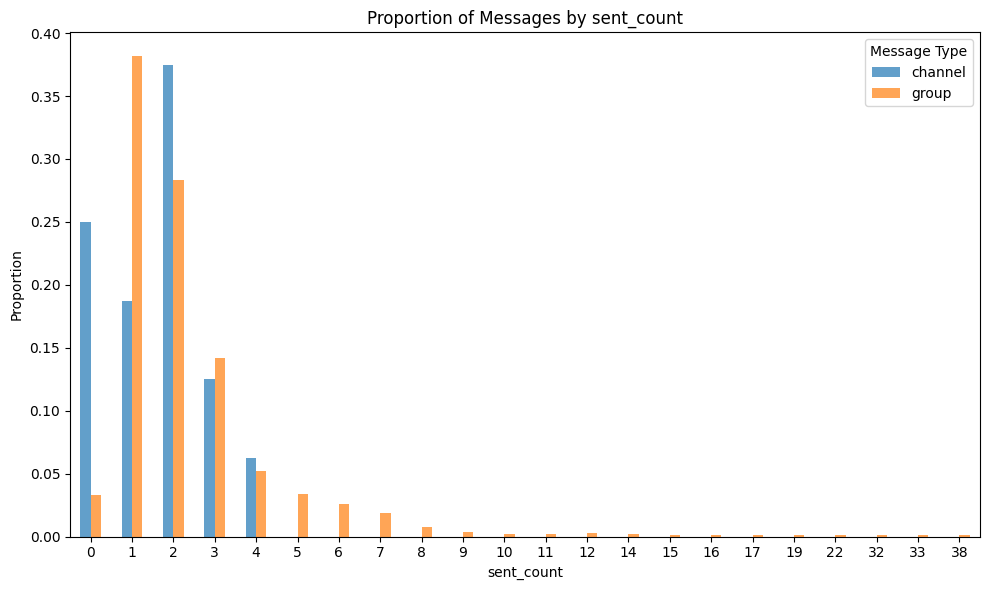

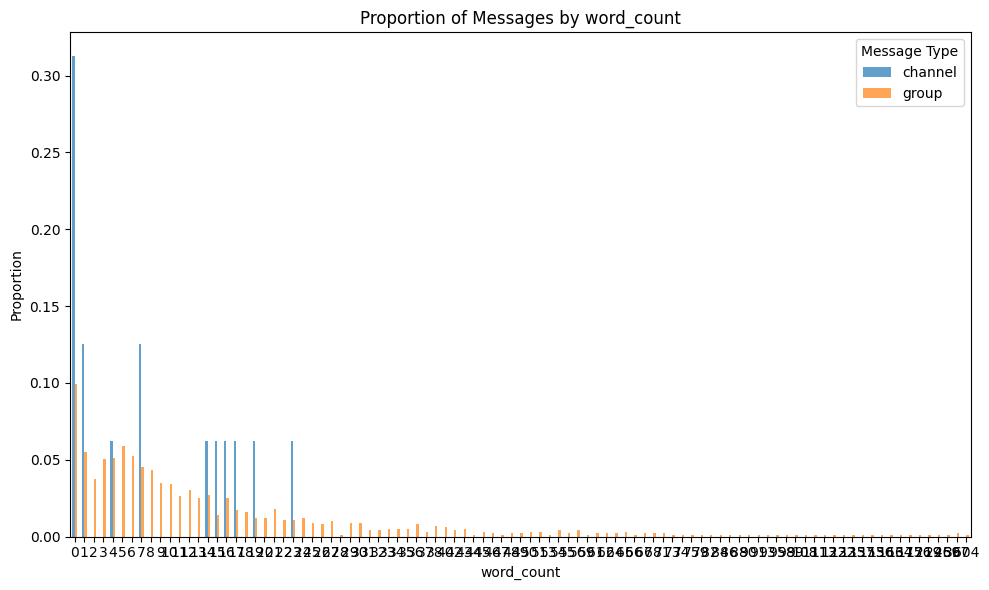

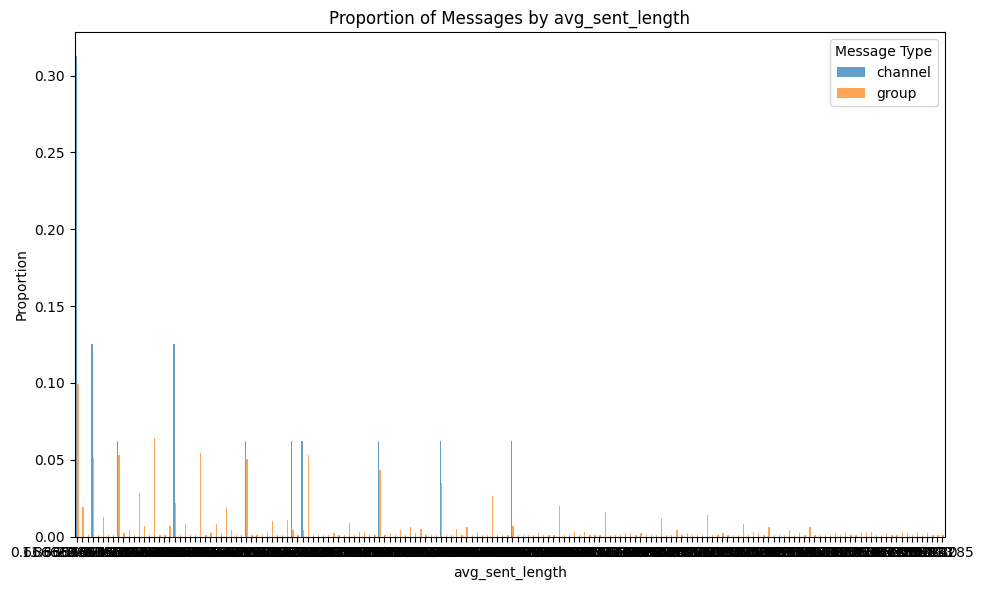

...

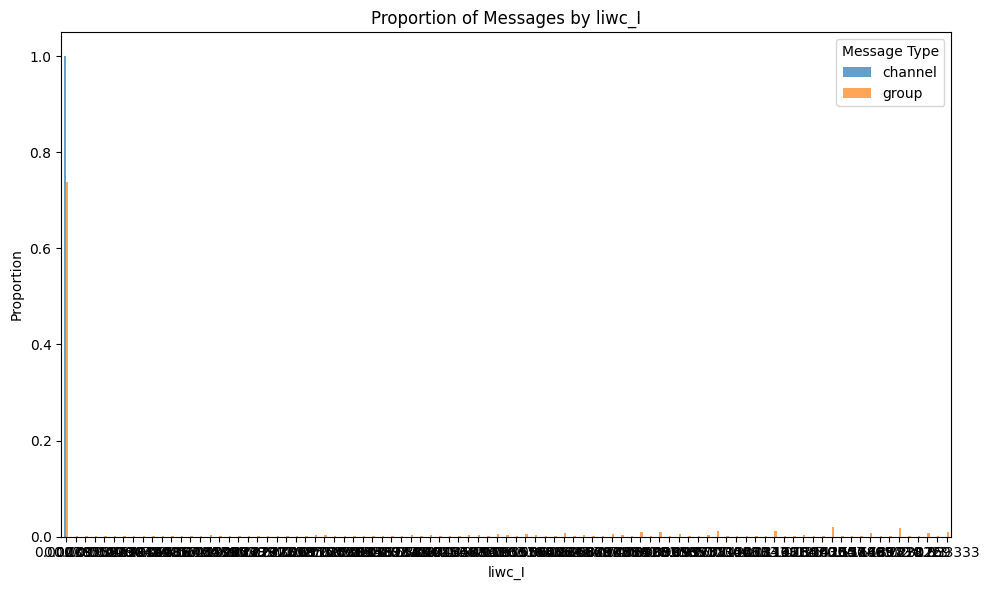

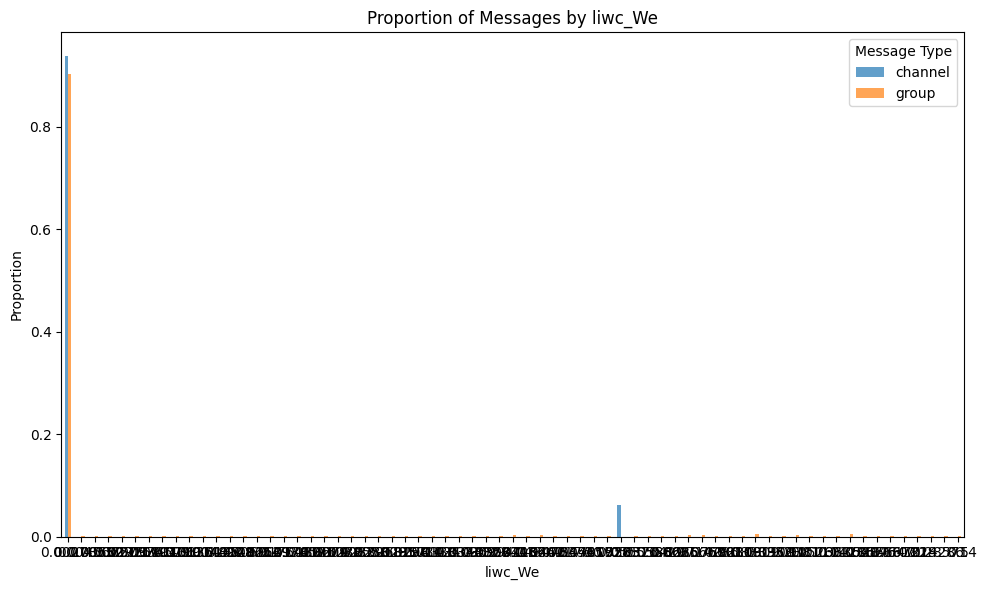

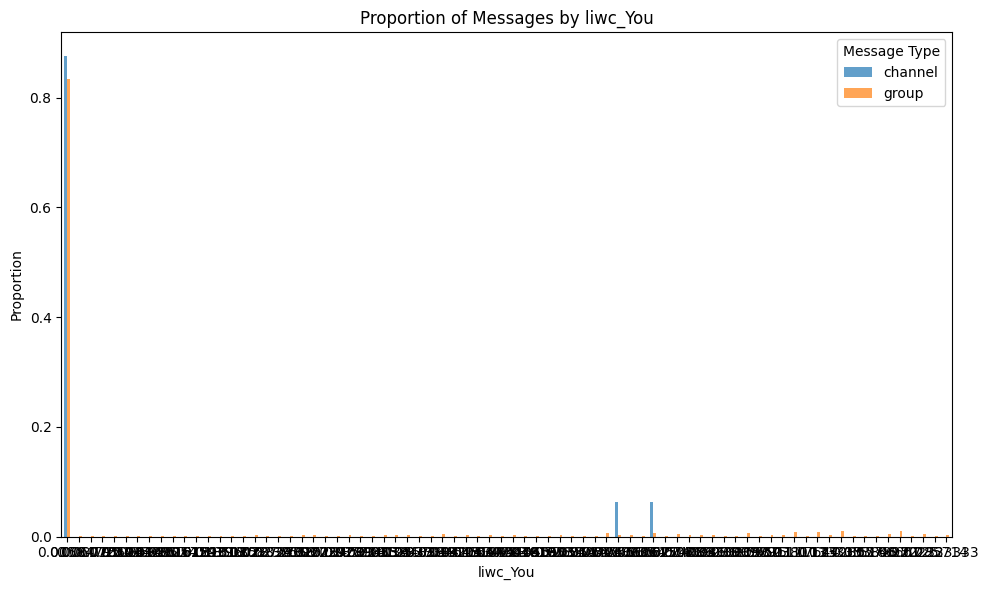

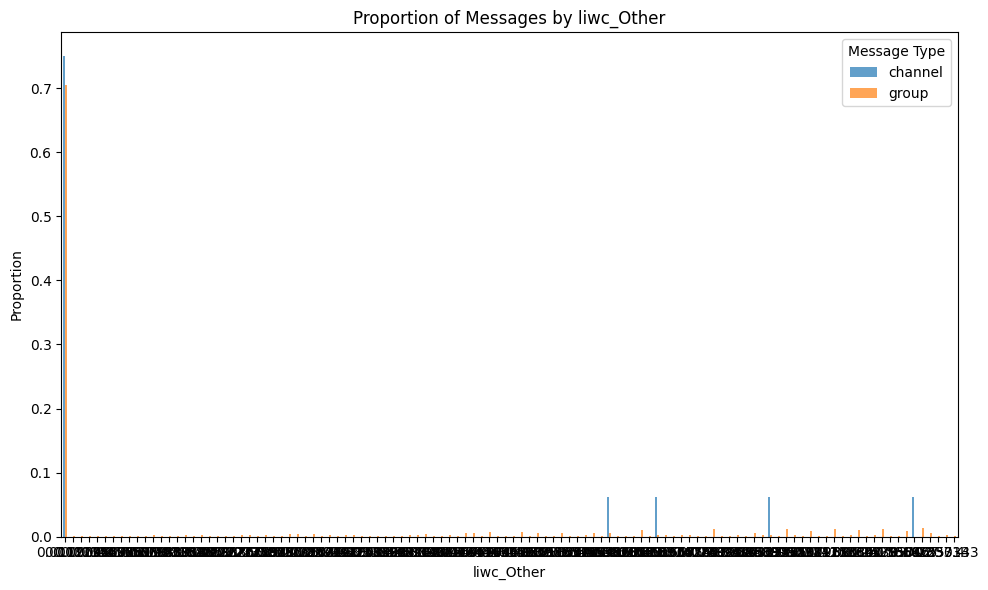

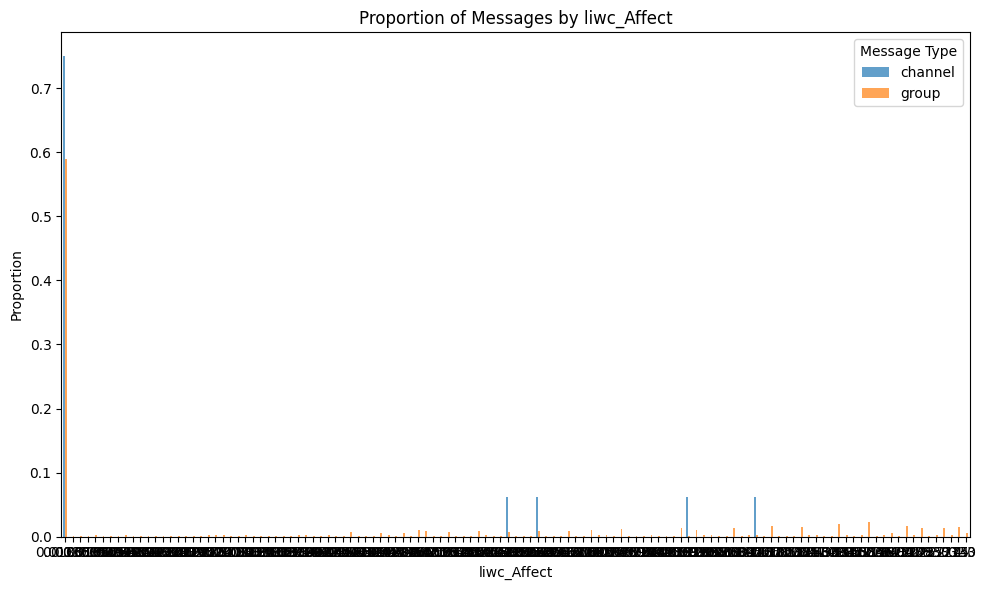

In [138]:
def plot_proportions(df, feature):
    proportions = df.groupby(['group_or_channel', feature]).size().unstack(fill_value=0)
    proportions = proportions.div(proportions.sum(axis=1), axis=0)
    proportions.T.plot(kind='bar', figsize=(10, 6), alpha=0.7)
    plt.title(f'Proportion of Messages by {feature}')
    plt.xlabel(feature)
    plt.ylabel('Proportion')
    plt.xticks(rotation=0)
    plt.legend(title='Message Type')
    plt.tight_layout()
    plt.show()

# Plot proportions for each feature
for feature in pre_features[:-1]:
    plot_proportions(plotting, feature)

# Own vs.Forwarded Messages

Text(0.5, 1.0, 'Own vs. Forwarded Messages')

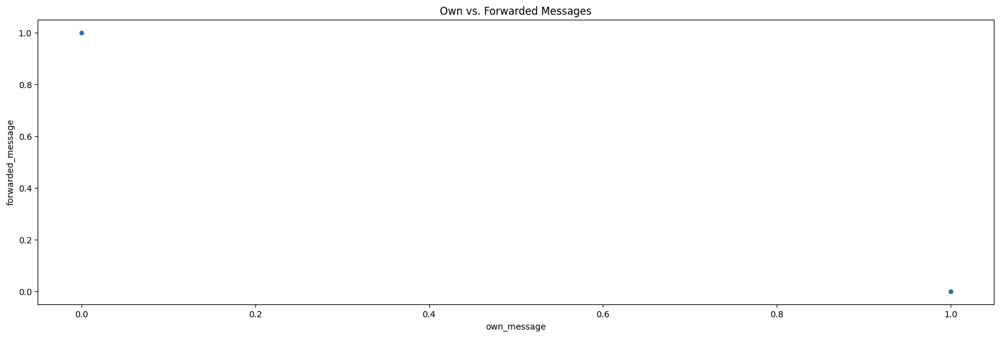

In [139]:
# scatter plot of own vs. forwarded messages
plt.figure(figsize=(20, 6)) 
sns.scatterplot(data=post_agg_author, x='own_message', y='forwarded_message')
plt.title('Own vs. Forwarded Messages')

# LIWC Features

<Figure size 1000x800 with 0 Axes>

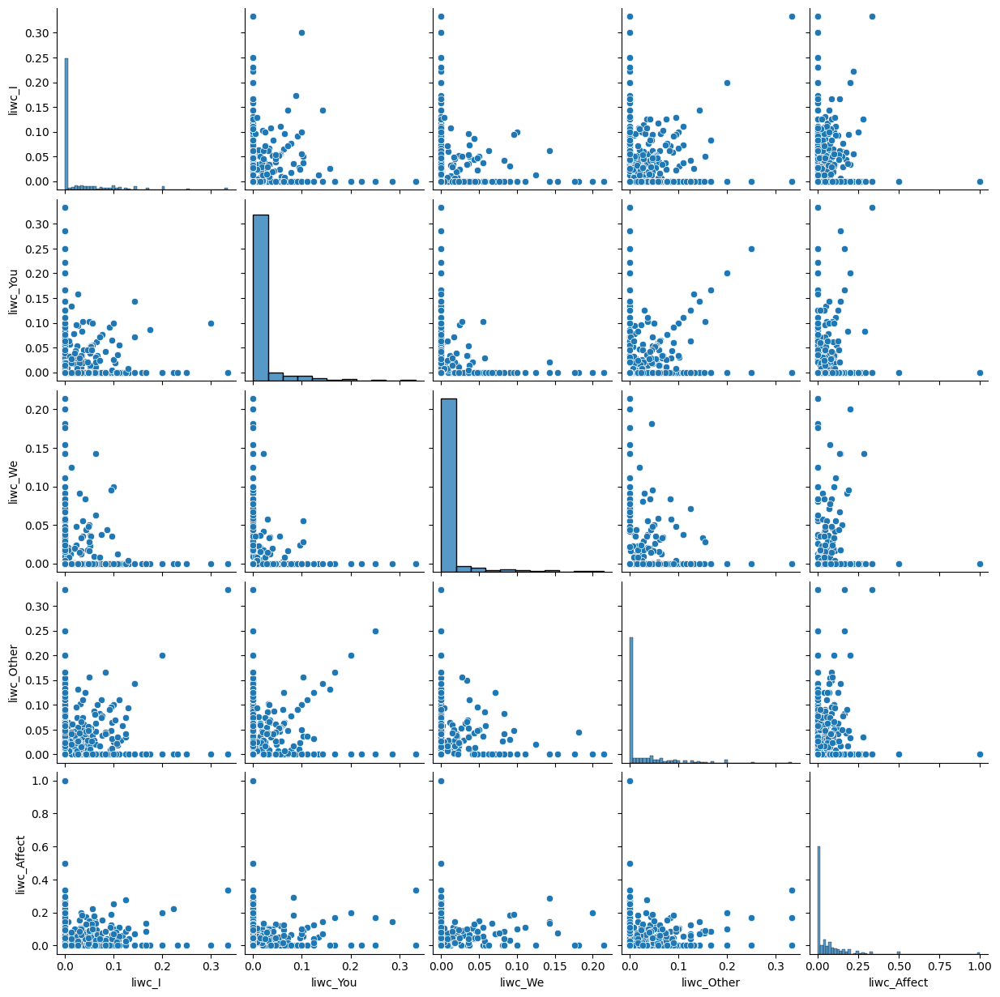

In [172]:
liwc = post_agg_author[['liwc_I', 'liwc_You', 'liwc_We', 'liwc_Other', 'liwc_Affect']]
liwc = liwc.dropna(how='all')

# Plot 
plt.figure(figsize=(10, 8))
sns.pairplot(liwc)

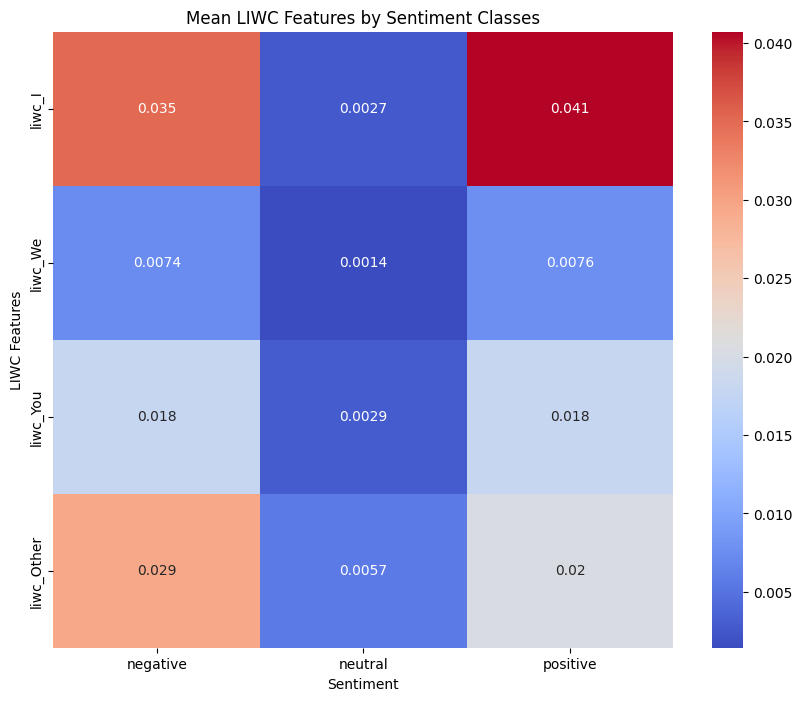

In [180]:
# Calculate the mean of each feature per sentiment class
mean_values = pre_agg[['liwc_I', 'liwc_We', 'liwc_You', 'liwc_Other', 'sentiment']].groupby('sentiment').mean().T

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(mean_values, annot=True, cmap='coolwarm')
plt.title('Mean LIWC Features by Sentiment Classes')
plt.xlabel('Sentiment')
plt.ylabel('LIWC Features')
plt.show()